<a href="https://colab.research.google.com/github/nicoletseng620/data/blob/main/nicoletseng620_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [327]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [328]:
import pandas as pd
import numpy as np
import seaborn as sns

In [329]:
data=pd.read_excel('/content/drive/MyDrive/Colab Notebooks/data.xlsx')

# New Section

In [330]:
data.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


In [331]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trestbps  303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalach   303 non-null    int64  
 8   exang     303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slope     303 non-null    int64  
 11  ca        303 non-null    int64  
 12  thal      303 non-null    int64  
 13  target    303 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 33.3 KB


In [332]:
# categorical data: sex, cp,fbs,restecg,exang, slope,thal,target
# Ordinal data: ca
# numerical data:age,trestbps,chol,thalach,oldpeak

In [333]:
data.shape

(303, 14)

In [334]:
# to know the type of variables
data.nunique()

age          41
sex           2
cp            4
trestbps     49
chol        152
fbs           2
restecg       3
thalach      91
exang         2
oldpeak      40
slope         3
ca            5
thal          4
target        2
dtype: int64

In [173]:
#check the data type
data.dtypes

age           int64
sex           int64
cp            int64
trestbps      int64
chol          int64
fbs           int64
restecg       int64
thalach       int64
exang         int64
oldpeak     float64
slope         int64
ca            int64
thal          int64
target        int64
dtype: object

The variables types are (1) categorical:sex,cp,fbs,restecg,exang,slope,thal,target
(2) Continuous: age, trestbps, chol, thalac, oldpeak (3) Ordinal: ca

In [174]:
# ca: The number of major vessels (0–3), numerical variable
data['ca'].unique()


array([0, 2, 1, 3, 4])

In [175]:
# variable ca ranges from 0 to 3, However, data appears 0 to 4, so we need to find "4" and change it to NaN
data.ca.value_counts()

0    175
1     65
2     38
3     20
4      5
Name: ca, dtype: int64

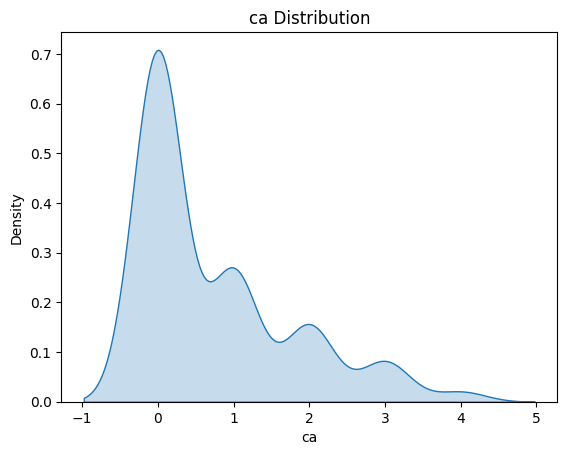

In [335]:
import seaborn as sns
import matplotlib.pyplot as plt
# plot a kernel density estimate (KDE) distribution of the 'ca' variable
sns.kdeplot(data['ca'], fill=True)

# set the title and axis labels
plt.title("ca Distribution")
plt.xlabel("ca")
plt.ylabel("Density")

# show the plot
plt.show()

In [177]:
data.ca.mode()

0    0
Name: ca, dtype: int64

In [178]:
# to find the row of "4"
data['ca']==4


0      False
1      False
2      False
3      False
4      False
       ...  
298    False
299    False
300    False
301    False
302    False
Name: ca, Length: 303, dtype: bool

In [179]:
data.loc[data['ca']==4]

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
92,52,1,2,138,223,0,1,169,0,0.0,2,4,2,1
158,58,1,1,125,220,0,1,144,0,0.4,1,4,3,1
163,38,1,2,138,175,0,1,173,0,0.0,2,4,2,1
164,38,1,2,138,175,0,1,173,0,0.0,2,4,2,1
251,43,1,0,132,247,1,0,143,1,0.1,1,4,3,0


In [180]:
data.loc[data['ca']==4,'ca']

92     4
158    4
163    4
164    4
251    4
Name: ca, dtype: int64

In [181]:
data.loc[data['ca']==4,'ca']=np.NaN

In [182]:
data['ca'].unique()

array([ 0.,  2.,  1.,  3., nan])

In [183]:
data.loc[92,'ca']

nan

In [184]:
# mode of ca: 0
data['ca'].mode()

0    0.0
Name: ca, dtype: float64

In [185]:
data['ca'].median()

0.0

In [186]:
# thal: A blood disorder called thalassemia, categorical variable
# Value 0: NULL (dropped from the dataset previously
# Value 1: fixed defect (no blood flow in some part of the heart)
# Value 2: normal blood flow
# Value 3: reversible defect (a blood flow is observed but it is not normal)
data['thal'].unique()

array([1, 2, 3, 0])

In [187]:
data['thal'].median()

2.0

In [188]:
data['thal'].mode()

0    2
Name: thal, dtype: int64

In [189]:
# "thal" variable: value 0 is null and should be dropped. so thal’ ranges from 1–3. There are 2 values of "0"
data.thal.value_counts()

2    166
3    117
1     18
0      2
Name: thal, dtype: int64

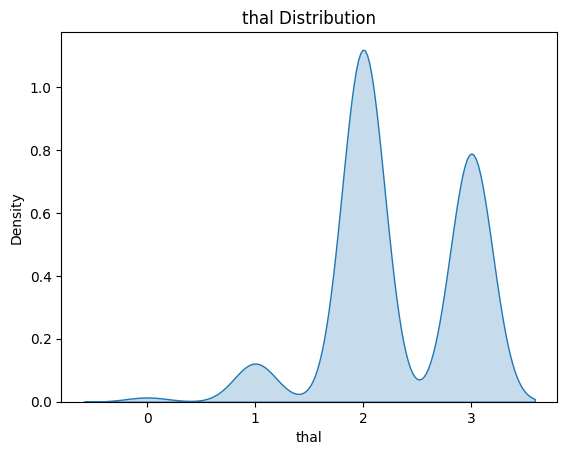

In [190]:
import seaborn as sns

# plot a kernel density estimate (KDE) distribution of the 'thal' variable
sns.kdeplot(data['thal'], fill=True)

# set the title and axis labels
plt.title("thal Distribution")
plt.xlabel("thal")
plt.ylabel("Density")

# show the plot
plt.show()

In [191]:
# therefore, we will drop 'thal' value of '0' from the data
data.loc[data['thal']==0,'thal']

48     0
281    0
Name: thal, dtype: int64

In [192]:
data.loc[data['thal']==0,'thal']=np.NaN
data['thal'].value_counts()

2.0    166
3.0    117
1.0     18
Name: thal, dtype: int64

In [193]:
data['thal'].unique()

array([ 1.,  2.,  3., nan])

In [194]:
# check for missing values to replace them
data.isnull().sum()

age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalach     0
exang       0
oldpeak     0
slope       0
ca          5
thal        2
target      0
dtype: int64

In [195]:
data.nunique()

age          41
sex           2
cp            4
trestbps     49
chol        152
fbs           2
restecg       3
thalach      91
exang         2
oldpeak      40
slope         3
ca            4
thal          3
target        2
dtype: int64

<Axes: >

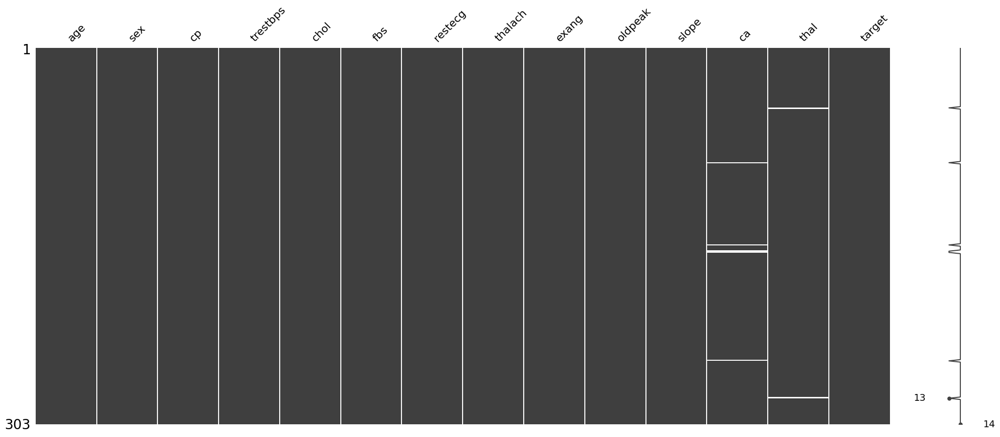

In [196]:
# visualize the missing values using Missingno library.
import pandas as pd
import missingno as msno
msno.matrix(data)

In [197]:
data['ca'].value_counts()


0.0    175
1.0     65
2.0     38
3.0     20
Name: ca, dtype: int64

In [198]:
data['thal'].value_counts()

2.0    166
3.0    117
1.0     18
Name: thal, dtype: int64

In [199]:
# replace the NaN value with median
data=data.fillna(data.median())
data

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0.0,1.0,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0.0,2.0,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0.0,2.0,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0.0,2.0,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0.0,2.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,57,0,0,140,241,0,1,123,1,0.2,1,0.0,3.0,0
299,45,1,3,110,264,0,1,132,0,1.2,1,0.0,3.0,0
300,68,1,0,144,193,1,1,141,0,3.4,1,2.0,3.0,0
301,57,1,0,130,131,0,1,115,1,1.2,1,1.0,3.0,0


In [200]:
data.isnull().sum()

age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalach     0
exang       0
oldpeak     0
slope       0
ca          0
thal        0
target      0
dtype: int64

In [201]:
# check for duplicate rows
duplicated=data.duplicated().sum()
duplicated

1

In [202]:
data.duplicated()

0      False
1      False
2      False
3      False
4      False
       ...  
298    False
299    False
300    False
301    False
302    False
Length: 303, dtype: bool

In [203]:
data.duplicated(keep=False)

0      False
1      False
2      False
3      False
4      False
       ...  
298    False
299    False
300    False
301    False
302    False
Length: 303, dtype: bool

In [204]:
duplicated=data[data.duplicated(keep=False)]
duplicated

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
163,38,1,2,138,175,0,1,173,0,0.0,2,0.0,2.0,1
164,38,1,2,138,175,0,1,173,0,0.0,2,0.0,2.0,1


In [205]:
duplicated.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
163,38,1,2,138,175,0,1,173,0,0.0,2,0.0,2.0,1
164,38,1,2,138,175,0,1,173,0,0.0,2,0.0,2.0,1


In [206]:
data.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,54.366337,0.683168,0.966997,131.623762,246.264026,0.148515,0.528053,149.646865,0.326733,1.039604,1.399340,0.663366,2.326733,0.544554
std,9.082101,0.466011,1.032052,17.538143,51.830751,0.356198,0.525860,22.905161,0.469794,1.161075,0.616226,0.934375,0.583020,0.498835
min,29.000000,0.000000,0.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,47.500000,0.000000,0.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,55.000000,1.000000,1.000000,130.000000,240.000000,0.000000,1.000000,153.000000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,274.500000,0.000000,1.000000,166.000000,1.000000,1.600000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,3.000000,3.000000,1.000000


In [207]:
# age: numerical variable
data['age'].unique()

array([63, 37, 41, 56, 57, 44, 52, 54, 48, 49, 64, 58, 50, 66, 43, 69, 59,
       42, 61, 40, 71, 51, 65, 53, 46, 45, 39, 47, 62, 34, 35, 29, 55, 60,
       67, 68, 74, 76, 70, 38, 77])

In [208]:
data.age.describe()

count    303.000000
mean      54.366337
std        9.082101
min       29.000000
25%       47.500000
50%       55.000000
75%       61.000000
max       77.000000
Name: age, dtype: float64

In [209]:
# mode of age:58 years old
data['age'].mode()

0    58
Name: age, dtype: int64

In [210]:
data['age'].median()

55.0

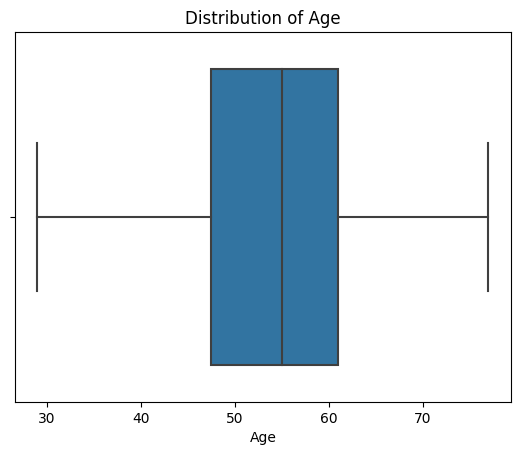

In [211]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.boxplot(x=data['age'])
plt.title("Distribution of Age")
plt.xlabel("Age")
plt.show()

<Axes: xlabel='age', ylabel='Count'>

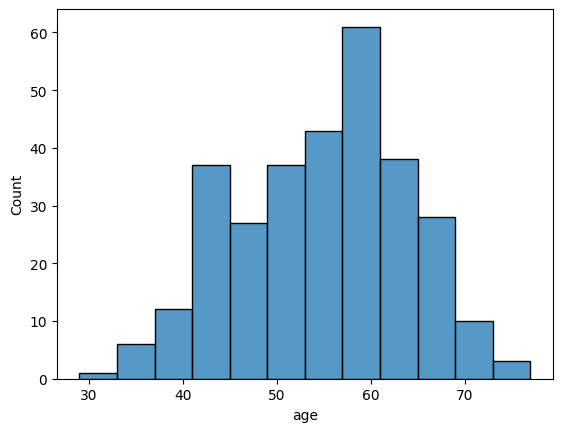

In [212]:
sns.histplot(data=data, x="age")

<ipython-input-213-3133294fd608>:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data['age'], shade=True)


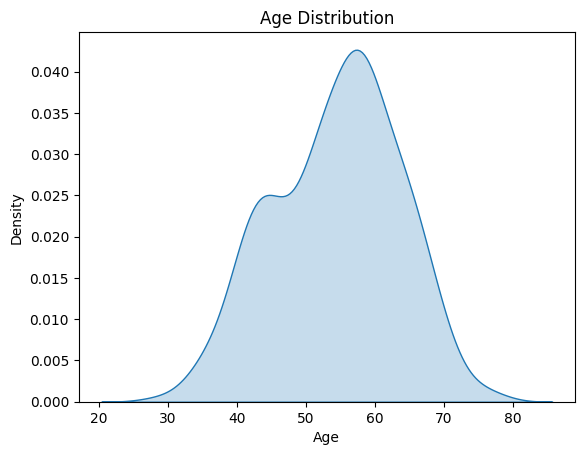

In [213]:
import seaborn as sns

# plot a kernel density estimate (KDE) distribution of the 'age' variable
sns.kdeplot(data['age'], shade=True)

# set the title and axis labels
plt.title("Age Distribution")
plt.xlabel("Age")
plt.ylabel("Density")

# show the plot
plt.show()

The plot graph does not show outlier in "Age"

In [214]:
def find_outliers():
  Q1_age = np.percentile(data.age,25)
  Q3_age = np.percentile(data.age,75)
  IQR=(Q3_age)-(Q1_age)
  Lower_tail = (Q1_age) - 1.5 * IQR
  Upper_tail = (Q3_age) + 1.5 * IQR
  outliers_age=[]
  for i in data.age:
      if i < Lower_tail or i > Upper_tail:
        outliers_age.append(i)
  return outliers_age
outliers_age=find_outliers()

In [215]:
print(outliers_age)

[]


In [216]:
num_outliers_age= len(outliers_age)
num_outliers_age

0

No outliers in "age' after calculation

# Outlier_age: None, no outlier value in "age"

In [217]:
# chest pain: categorical value, Value 3: asymptomatic, Value 1: atypical angina, Value 2: non-anginal pain, Value 0: typical angina

data['cp'].unique()

array([3, 2, 1, 0])

In [218]:
#mode of chest pain
data['cp'].mode()

0    0
Name: cp, dtype: int64

# Most of people have typical angina

In [219]:
gb_cp=data.groupby('cp').apply(len)
gb_cp

cp
0    143
1     50
2     87
3     23
dtype: int64

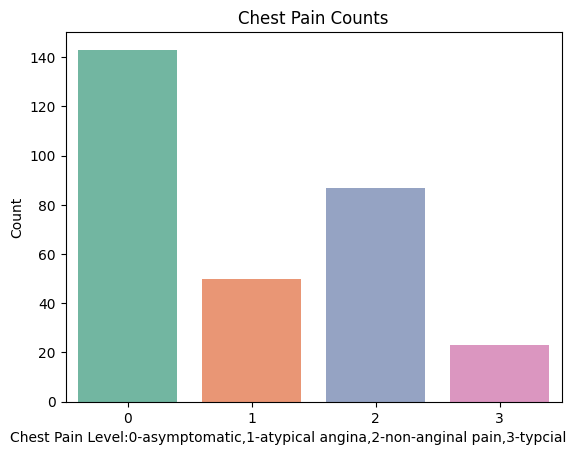

In [220]:
import seaborn as sns
import matplotlib.pyplot as plt

# create a sample categorical variable with levels
category= ['3:asymptomatic', '1:atypical agina', '2:non-aginal pain', '0:typical angina']
# plot the category counts with different colors for each level
sns.countplot(x=data['cp'], palette="Set2")

# add labels to the plot
plt.title("Chest Pain Counts")
plt.xlabel("Chest Pain Level:0-asymptomatic,1-atypical angina,2-non-anginal pain,3-typcial angina")
plt.ylabel("Count")

# show the plot
plt.show()

<Axes: xlabel='cp', ylabel='Count'>

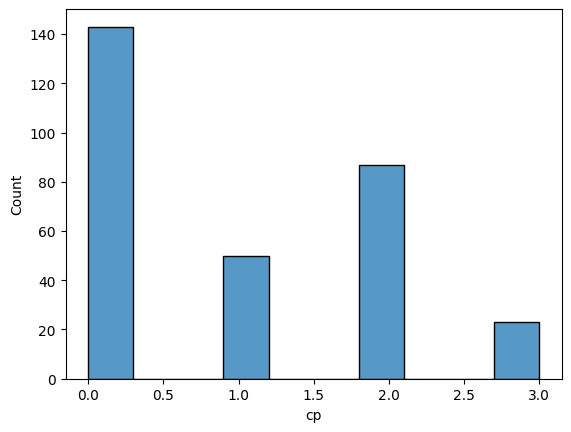

In [221]:
sns.histplot(data=data, x="cp")

In [222]:
# sex: categorical variable, 1 = male, 0 = female
data['sex'].unique()

array([1, 0])

In [223]:
# mode of sex: male
data['sex'].mode()

0    1
Name: sex, dtype: int64

In [224]:
gb_sex=data.groupby('sex').apply(len)
gb_sex

sex
0     96
1    207
dtype: int64

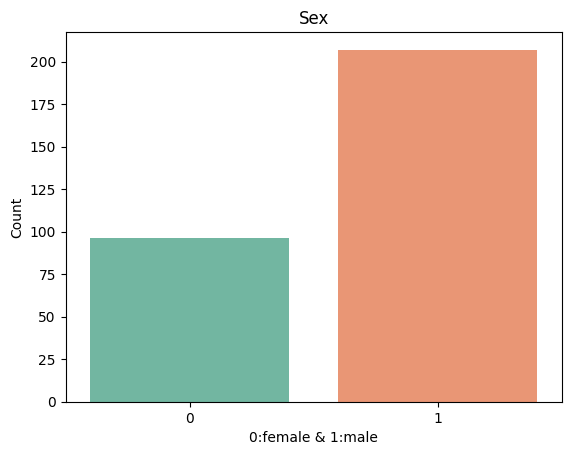

In [225]:
# create a sample categorical variable with male & female
category= ['0:female', '1:male']
# plot the category counts with different colors for each level
sns.countplot(x=data['sex'], palette="Set2")

# add labels to the plot
plt.title("Sex")
plt.xlabel("0:female & 1:male")
plt.ylabel("Count")

# show the plot
plt.show()

# The majotiry of participants in the study are male

In [226]:
#trestbps: The person’s resting blood pressure, numerial variable
data['trestbps'].unique()

array([145, 130, 120, 140, 172, 150, 110, 135, 160, 105, 125, 142, 155,
       104, 138, 128, 108, 134, 122, 115, 118, 100, 124,  94, 112, 102,
       152, 101, 132, 148, 178, 129, 180, 136, 126, 106, 156, 170, 146,
       117, 200, 165, 174, 192, 144, 123, 154, 114, 164])

In [227]:
# mode of trestbps: 120 mm Hg (normal BP)
data['trestbps'].mode()

0    120
Name: trestbps, dtype: int64

In [228]:
data['trestbps'].describe()

count    303.000000
mean     131.623762
std       17.538143
min       94.000000
25%      120.000000
50%      130.000000
75%      140.000000
max      200.000000
Name: trestbps, dtype: float64

In [229]:
# mode of trestbps, resting blood pressure
data['trestbps'].mode()

0    120
Name: trestbps, dtype: int64

In [230]:
# median of trestbps
data['trestbps'].median()

130.0

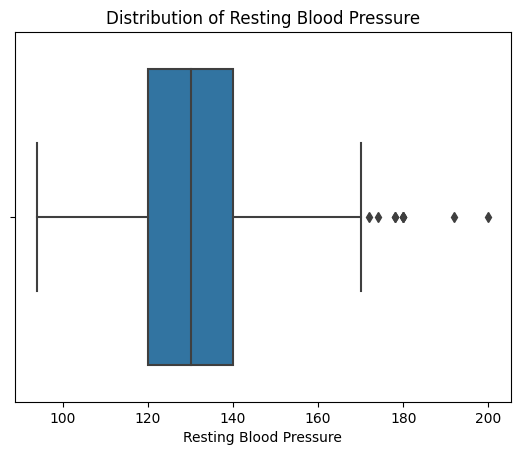

In [231]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.boxplot(x=data['trestbps'])
plt.title("Distribution of Resting Blood Pressure")
plt.xlabel("Resting Blood Pressure")
plt.show()

<Axes: xlabel='trestbps', ylabel='Count'>

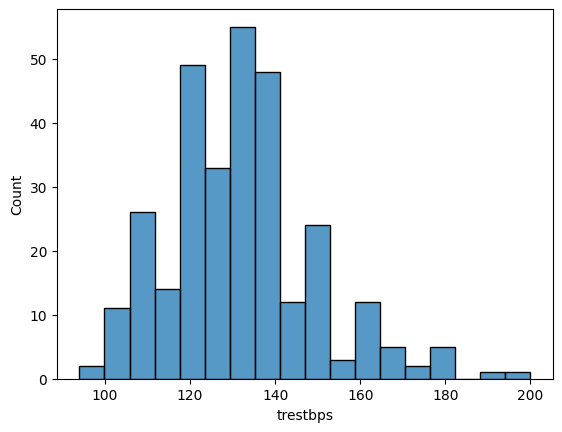

In [232]:
sns.histplot(data=data, x="trestbps")

<ipython-input-233-f0c45eea3dd7>:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data['trestbps'], shade=True)


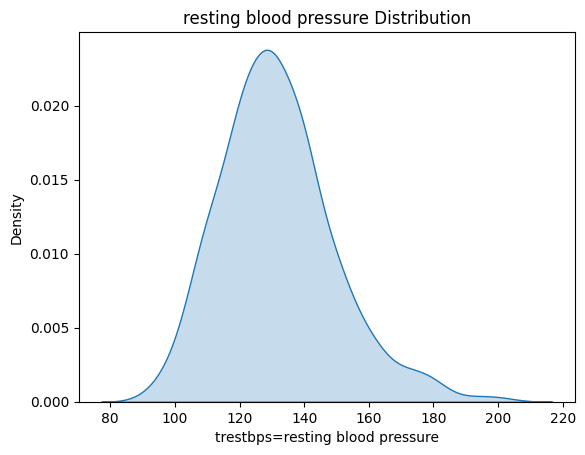

In [233]:
import seaborn as sns

# plot a kernel density estimate (KDE) distribution of the 'trestbps' variable
sns.kdeplot(data['trestbps'], shade=True)

# set the title and axis labels
plt.title("resting blood pressure Distribution")
plt.xlabel("trestbps=resting blood pressure")
plt.ylabel("Density")

# show the plot
plt.show()

# the plot graph shows outliers above upper tail in "trestbps", resting blood pressure. It's right skewed distribution. There are outliers on the right side.

In [234]:
def find_outliers():
  Q1_trestbps = np.percentile(data.trestbps,25)
  Q3_trestbps = np.percentile(data.trestbps,75)
  IQR=(Q3_trestbps)-(Q1_trestbps)
  Lower_tail = (Q1_trestbps) - 1.5 * IQR
  Upper_tail = (Q3_trestbps) + 1.5 * IQR
  outliers_trestbps = []
  for i in data.trestbps:
      if i < Lower_tail or i > Upper_tail:
        outliers_trestbps.append(i)
  return outliers_trestbps
outliers_trestbps = find_outliers()

In [235]:
print(outliers_trestbps)

[172, 178, 180, 180, 200, 174, 192, 178, 180]


In [236]:
num_outliers_trestbps = len(outliers_trestbps)
num_outliers_trestbps

9

# trestbps, rest blood pressure has 9 outliers

In [237]:
# chol: The person’s cholesterol measurement in mg/dl, numerial variable,
#Normal: Less than 200 mg/dL. Borderline high: 200 to 239 mg/dL. High: At or above 240 mg/dL.
data['chol'].unique()

array([233, 250, 204, 236, 354, 192, 294, 263, 199, 168, 239, 275, 266,
       211, 283, 219, 340, 226, 247, 234, 243, 302, 212, 175, 417, 197,
       198, 177, 273, 213, 304, 232, 269, 360, 308, 245, 208, 264, 321,
       325, 235, 257, 216, 256, 231, 141, 252, 201, 222, 260, 182, 303,
       265, 309, 186, 203, 183, 220, 209, 258, 227, 261, 221, 205, 240,
       318, 298, 564, 277, 214, 248, 255, 207, 223, 288, 160, 394, 315,
       246, 244, 270, 195, 196, 254, 126, 313, 262, 215, 193, 271, 268,
       267, 210, 295, 306, 178, 242, 180, 228, 149, 278, 253, 342, 157,
       286, 229, 284, 224, 206, 167, 230, 335, 276, 353, 225, 330, 290,
       172, 305, 188, 282, 185, 326, 274, 164, 307, 249, 341, 407, 217,
       174, 281, 289, 322, 299, 300, 293, 184, 409, 259, 200, 327, 237,
       218, 319, 166, 311, 169, 187, 176, 241, 131])

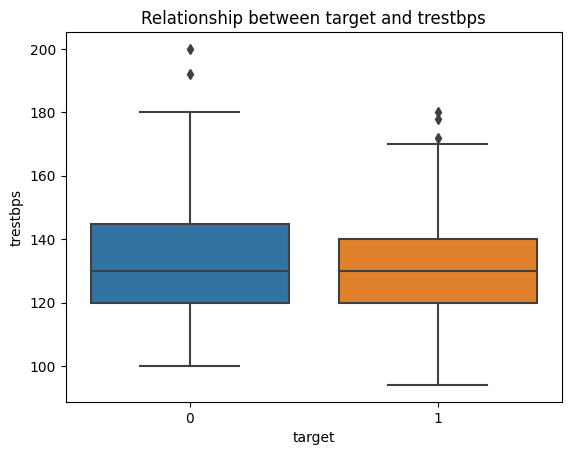

In [366]:
# to know about relationship between trestbps and target(heartdisease)
import seaborn as sns
import matplotlib.pyplot as plt

sns.boxplot(x='target', y='trestbps', data=data)
plt.xlabel('target')
plt.ylabel('trestbps')
plt.title('Relationship between target and trestbps')
plt.show()

There are outliers for both "disase" and " no diseas" group. In general, the average resting blood pressure for both groups is close, between 120-140 mm Hg

In [238]:
# mode of chol:
data['chol'].mode()

0    197
1    204
2    234
Name: chol, dtype: int64

In [239]:
# median of cholesterol
data['chol'].median()

240.0

In [240]:
data['chol'].describe()

count    303.000000
mean     246.264026
std       51.830751
min      126.000000
25%      211.000000
50%      240.000000
75%      274.500000
max      564.000000
Name: chol, dtype: float64

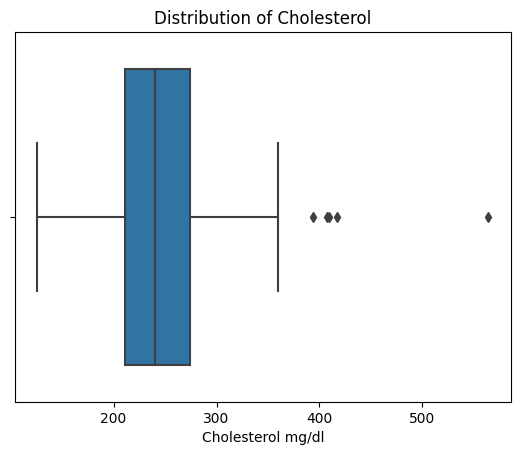

In [241]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.boxplot(x=data['chol'])
plt.title("Distribution of Cholesterol")
plt.xlabel("Cholesterol mg/dl")
plt.show()

#The plot graph shows outliers on the right above upper tail and it's right skewed distribution

<Axes: xlabel='chol', ylabel='Count'>

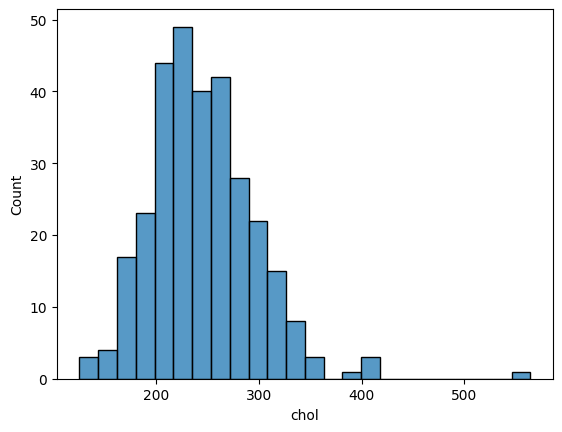

In [242]:
sns.histplot(data=data, x="chol")

<ipython-input-243-8e88f02092b3>:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data['chol'], shade=True)


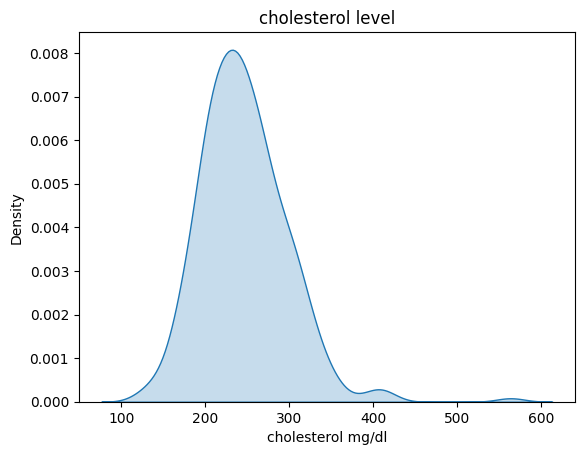

In [243]:
import seaborn as sns

# plot a kernel density estimate (KDE) distribution of the 'chol' variable
sns.kdeplot(data['chol'], shade=True)

# set the title and axis labels
plt.title("cholesterol level")
plt.xlabel("cholesterol mg/dl")
plt.ylabel("Density")

# show the plot
plt.show()

In [244]:
def find_outliers():
  Q1_chol = np.percentile(data.chol,25)
  Q3_chol = np.percentile(data.chol,75)
  IQR=(Q3_chol)-(Q1_chol)
  Lower_tail = (Q1_chol) - 1.5 * IQR
  Upper_tail = (Q3_chol) + 1.5 * IQR
  outliers_chol=[]
  for i in data.chol:
      if i < Lower_tail or i > Upper_tail:
        outliers_chol.append(i)
  return outliers_chol
outliers_chol=find_outliers()

In [245]:
print(outliers_chol)

[417, 564, 394, 407, 409]


In [246]:
num_outliers_chol = len(outliers_chol)
num_outliers_chol

5

# cholesterol has 5 outliers

In [247]:
# fbs: The person’s fasting blood sugar (> 120 mg/dl, 1 = true; 0 = false), categorical variable
data['fbs'].unique()

array([1, 0])

In [248]:
# mode of fbs: 0, fast blood sugar <120 mg/dl
data['fbs'].mode()

0    0
Name: fbs, dtype: int64

In [249]:
gb_fbs=data.groupby('fbs').apply(len)
gb_fbs

fbs
0    258
1     45
dtype: int64

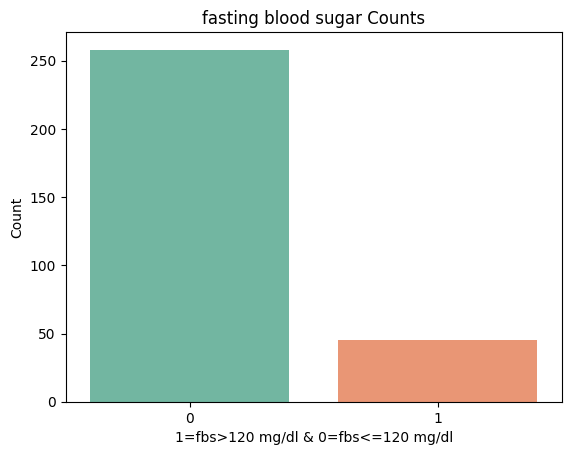

In [336]:
import seaborn as sns
import matplotlib.pyplot as plt

# create a sample categorical variable with fbs
#category= ['fbs > 120 mg/dl, 1 = true; 0 = false]
# plot the category counts with different colors for each level
sns.countplot(x=data['fbs'], palette="Set2")

# add labels to the plot
plt.title("fasting blood sugar Counts")
plt.xlabel("1=fbs>120 mg/dl & 0=fbs<=120 mg/dl")
plt.ylabel("Count")

# show the plot
plt.show()

# Majority of the participants' fasting blood sugar <= 120 mg/dl, normal

In [337]:
#restecg: resting electrocardiographic results, categorical variable
#Value 0: showing probable or definite left ventricular hypertrophy by Estes’ criteria
#Value 1: normal
#Value 2: having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV)
data['restecg'].unique()

array([0, 1, 2])

In [338]:
#mode of restecg:1, normal
data['restecg'].mode()

0    1
Name: restecg, dtype: int64

In [339]:
gb_restecg=data.groupby('restecg').apply(len)
gb_restecg

restecg
0    147
1    152
2      4
dtype: int64

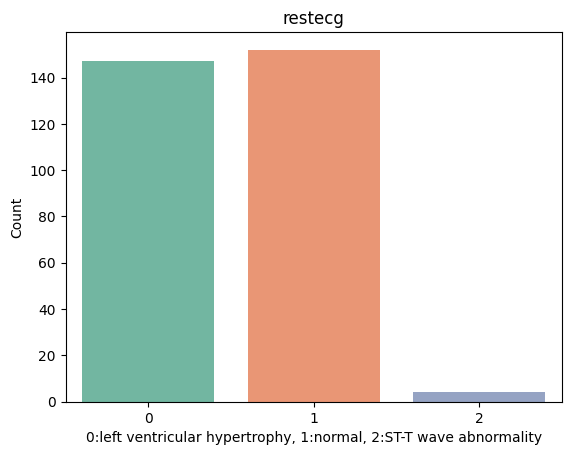

In [340]:
# create a sample categorical variable with restecg
category= ['0: showing probable or definite left ventricular hypertrophy by Estes’ criteria, 1:normal, 2:aving ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV']
# plot the category counts with different colors for each level
sns.countplot(x=data['restecg'], palette="Set2")

# add labels to the plot
plt.title("restecg")
plt.xlabel("0:left ventricular hypertrophy, 1:normal, 2:ST-T wave abnormality")
plt.ylabel("Count")

# show the plot
plt.show()

# In resting ECG, the majority of participants are normal or left ventricular hypertrophy

In [341]:
# thalach: The person’s maximum heart rate achieved, numerical variable
data['thalach'].unique()


array([150, 187, 172, 178, 163, 148, 153, 173, 162, 174, 160, 139, 171,
       144, 158, 114, 151, 161, 179, 137, 157, 123, 152, 168, 140, 188,
       125, 170, 165, 142, 180, 143, 182, 156, 115, 149, 146, 175, 186,
       185, 159, 130, 190, 132, 147, 154, 202, 166, 164, 184, 122, 169,
       138, 111, 145, 194, 131, 133, 155, 167, 192, 121,  96, 126, 105,
       181, 116, 108, 129, 120, 112, 128, 109, 113,  99, 177, 141, 136,
        97, 127, 103, 124,  88, 195, 106,  95, 117,  71, 118, 134,  90])

In [257]:
# mode of thalach: 162 (heart rate)
data['thalach'].mode()

0    162
Name: thalach, dtype: int64

In [258]:
data['thalach'].median()

153.0

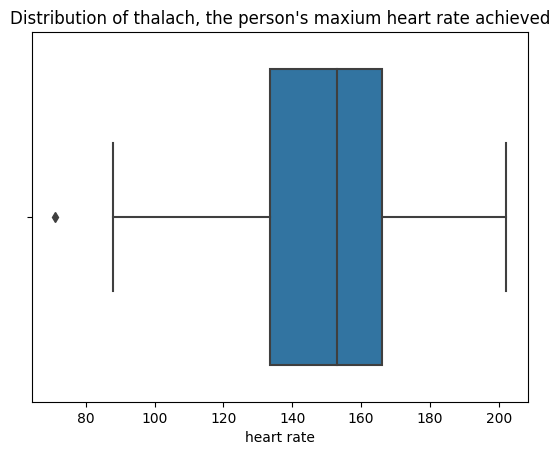

In [259]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.boxplot(x=data['thalach'])
plt.title("Distribution of thalach, the person's maxium heart rate achieved")
plt.xlabel("heart rate")
plt.show()

<ipython-input-260-7f7273fecacc>:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data['thalach'], shade=True)


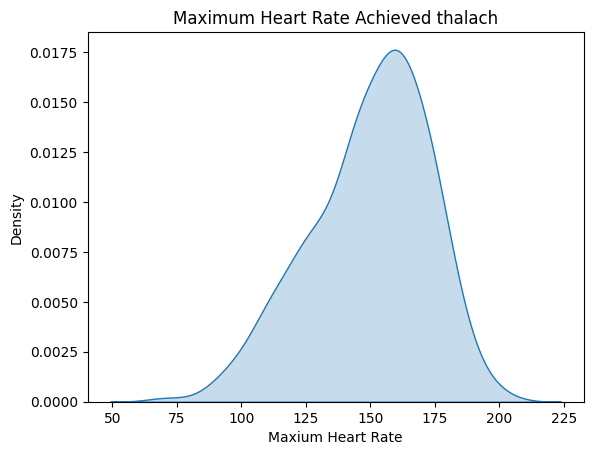

In [260]:
import seaborn as sns

# plot a kernel density estimate (KDE) distribution of the 'chol' variable
sns.kdeplot(data['thalach'], shade=True)

# set the title and axis labels
plt.title("Maximum Heart Rate Achieved thalach")
plt.xlabel("Maxium Heart Rate")
plt.ylabel("Density")

# show the plot
plt.show()

<Axes: xlabel='thalach', ylabel='Count'>

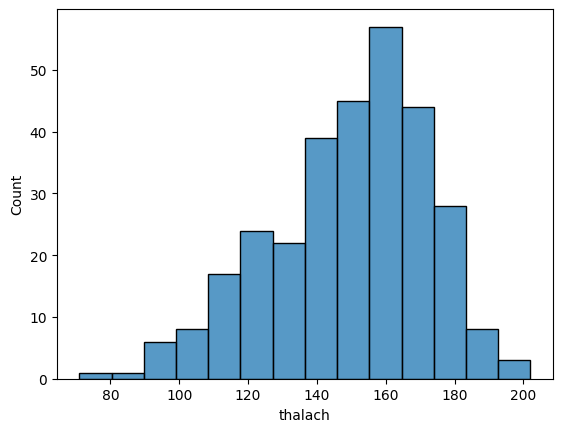

In [261]:
sns.histplot(data=data, x="thalach")

In [262]:
# find outliers
def find_outliers():
  Q1_thalach = np.percentile(data.thalach,25)
  Q3_thalach = np.percentile(data.thalach,75)
  IQR=(Q3_thalach)-(Q1_thalach)
  Lower_tail = (Q1_thalach) - 1.5 * IQR
  Upper_tail = (Q3_thalach) + 1.5 * IQR
  outliers_thalach=[]
  for i in data.thalach:
      if i < Lower_tail or i > Upper_tail:
        outliers_thalach.append(i)
  return outliers_thalach
outliers_thalach=find_outliers()


In [263]:
print(outliers_thalach)

[71]


# "thalach"(the person's maximum heart rate) has one outlier, 71, on the left side below lower tail in "thalach, maximum heart rate achieved) Left skewed curve

In [264]:
# exang: Exercise induced angina (1 = yes; 0 = no), categorical variable
data['exang'].unique()


array([0, 1])

In [265]:
# mode of exang: 0, no exercise induced angina
data['exang'].mode()

0    0
Name: exang, dtype: int64

In [266]:
gb_exang=data.groupby('exang').apply(len)

In [267]:
gb_exang

exang
0    204
1     99
dtype: int64

Text(0, 0.5, 'Count')

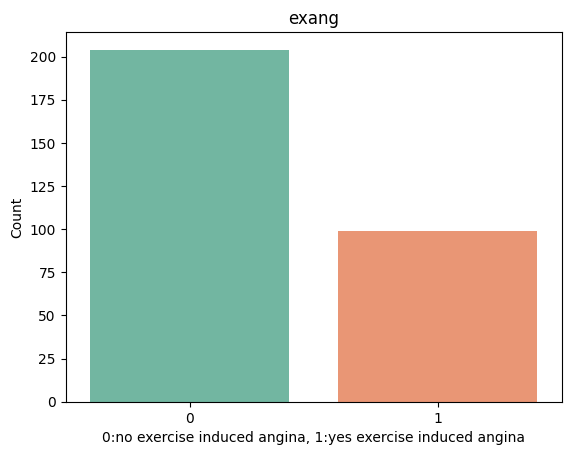

In [268]:
# create a sample categorical variable with exang
category= ['exercise indeced angina, 0=no,1=yes']
# plot the category counts with different colors for each level
sns.countplot(x=data['exang'], palette="Set2")

# add labels to the plot
plt.title("exang")
plt.xlabel("0:no exercise induced angina, 1:yes exercise induced angina")
plt.ylabel("Count")

# show the plot

# The majority of participants do not have exercise induced angina

In [269]:
#oldpeak: ST depression induced by exercise relative to rest (‘ST’ relates to positions on the ECG plot. See more here), numerical variable
data['oldpeak'].unique()

array([2.3, 3.5, 1.4, 0.8, 0.6, 0.4, 1.3, 0. , 0.5, 1.6, 1.2, 0.2, 1.8,
       1. , 2.6, 1.5, 3. , 2.4, 0.1, 1.9, 4.2, 1.1, 2. , 0.7, 0.3, 0.9,
       3.6, 3.1, 3.2, 2.5, 2.2, 2.8, 3.4, 6.2, 4. , 5.6, 2.9, 2.1, 3.8,
       4.4])

In [270]:
data['oldpeak'].describe()

count    303.000000
mean       1.039604
std        1.161075
min        0.000000
25%        0.000000
50%        0.800000
75%        1.600000
max        6.200000
Name: oldpeak, dtype: float64

In [271]:
#mode of oldpeak:0
data['oldpeak'].mode()

0    0.0
Name: oldpeak, dtype: float64

In [272]:
data['oldpeak'].median()

0.8

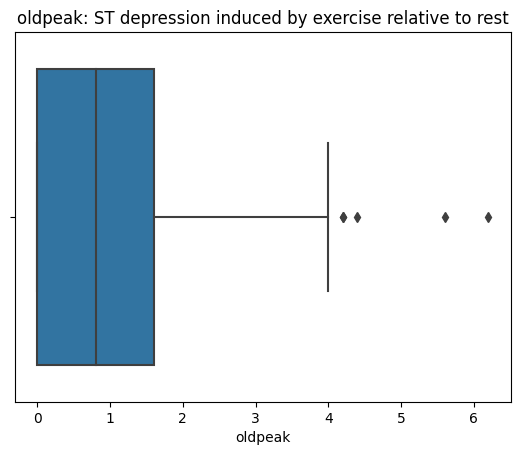

In [273]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.boxplot(x=data['oldpeak'])
plt.title("oldpeak: ST depression induced by exercise relative to rest")
plt.xlabel("oldpeak")
plt.show()

#the graph shows there are outliers on the right side above upper tail, right-skewed curve

<Axes: xlabel='oldpeak', ylabel='Count'>

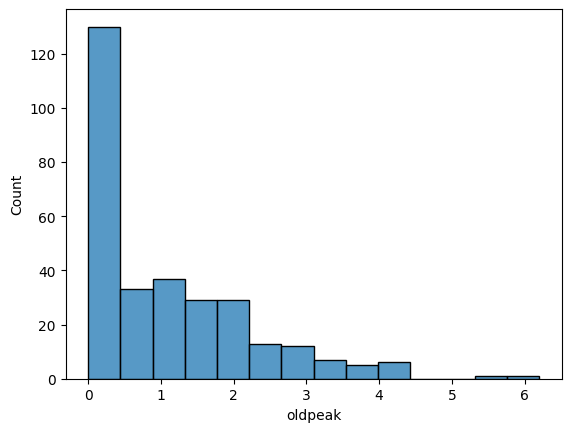

In [274]:
import seaborn as sns
sns.histplot(data=data,x='oldpeak')


<ipython-input-275-99ac8b1f96f7>:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data['oldpeak'], shade=True)


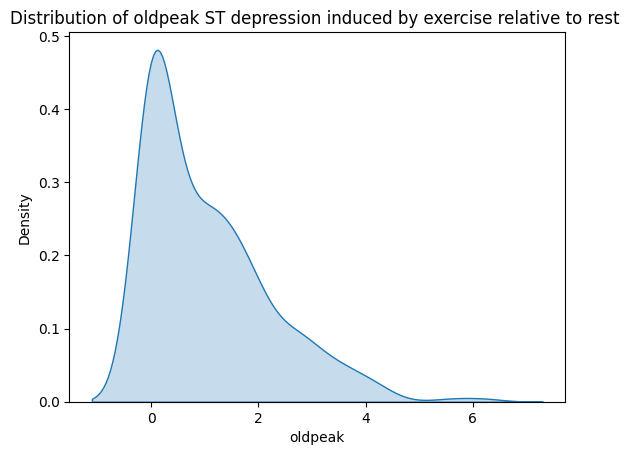

In [275]:
import seaborn as sns

# plot a kernel density estimate (KDE) distribution of the 'oldpeak' variable
sns.kdeplot(data['oldpeak'], shade=True)

# set the title and axis labels
plt.title("Distribution of oldpeak ST depression induced by exercise relative to rest ")
plt.xlabel("oldpeak")
plt.ylabel("Density")

# show the plot
plt.show()

The distribution graph indicates oldpeak is right skewed, longer tail on the right side

In [276]:
# find outliers
def find_outliers():
  Q1_oldpeak = np.percentile(data.oldpeak,25)
  Q3_oldpeak = np.percentile(data.oldpeak,75)
  IQR=(Q3_oldpeak)-(Q1_oldpeak)
  Lower_tail = (Q1_oldpeak) - 1.5 * IQR
  Upper_tail = (Q3_oldpeak) + 1.5 * IQR
  outliers_oldpeak=[]
  for i in data.oldpeak:
      if i < Lower_tail or i > Upper_tail:
        outliers_oldpeak.append(i)
  return outliers_oldpeak
outliers_oldpeak=find_outliers()

In [277]:
print(outliers_oldpeak)

[4.2, 6.2, 5.6, 4.2, 4.4]


# "oldpeak" (ST depression induced by exercise relative to rest), has 5 outliers

In [278]:
#slope: the slope of the peak exercise ST segment, categorical variable
# 0: downsloping; 1: flat; 2: upsloping
data['slope'].unique()

array([0, 2, 1])

In [279]:
#mode of slope:2,upsloping
data['slope'].mode()

0    2
Name: slope, dtype: int64

In [280]:
gb_slope=data.groupby('slope').apply(len)

In [281]:
gb_slope

slope
0     21
1    140
2    142
dtype: int64

# The majority of participants have downsloping or flat slope of the peak exercise ST segment.

In [282]:
# target: Heart disease (1 = disease, 0= no disease), categorical variable
data['target'].unique()


array([1, 0])

In [283]:
# heart disease value count
data['target'].value_counts()

1    165
0    138
Name: target, dtype: int64

In [284]:
# mode of target: 0heart disease
data['target'].mode()

0    1
Name: target, dtype: int64

# There are more diseased participants than healthier(no disease)

In [285]:
# Drop outliers
# Define columns that have outliers
outlier_column = ['trestbps','chol','thalach','oldpeak']  # Specify the columns to drop outliers from

# Identify and remove outliers
for column in outlier_column:
    q75, q25 = np.percentile(data.loc[:, column], [75, 25])
    intr_qr = q75 - q25
    max_threshold = q75 + (1.5 * intr_qr)
    min_threshold = q25 - (1.5 * intr_qr)
    data = data.loc[(data[column] >= min_threshold) & (data[column] <= max_threshold)]

In [286]:
data

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,left ventricular hypertrophy,150,0,2.3,0,0.0,1.0,1
1,37,1,2,130,250,0,normal,187,0,3.5,0,0.0,2.0,1
2,41,0,1,130,204,0,left ventricular hypertrophy,172,0,1.4,2,0.0,2.0,1
3,56,1,1,120,236,0,normal,178,0,0.8,2,0.0,2.0,1
4,57,0,0,120,354,0,normal,163,1,0.6,2,0.0,2.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,57,0,0,140,241,0,normal,123,1,0.2,1,0.0,3.0,0
299,45,1,3,110,264,0,normal,132,0,1.2,1,0.0,3.0,0
300,68,1,0,144,193,1,normal,141,0,3.4,1,2.0,3.0,0
301,57,1,0,130,131,0,normal,115,1,1.2,1,1.0,3.0,0


In [287]:
# distribution and relationship
data.target.value_counts()

1    159
0    125
Name: target, dtype: int64

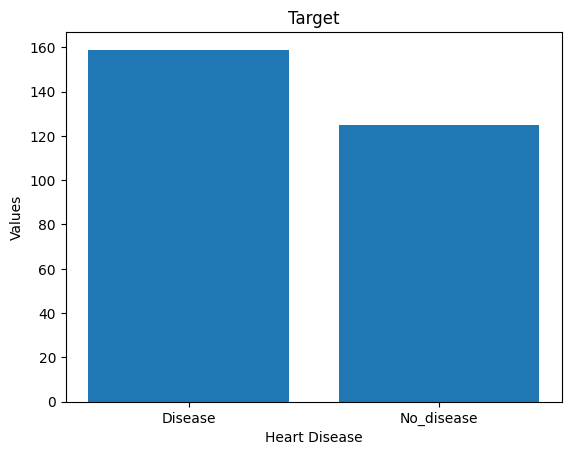

In [288]:
import matplotlib.pyplot as plt
# Data
x = ['Disease','No_disease']
y = [159,125]
# Create bar chart
plt.bar(x, y)

# Add labels and title
plt.xlabel('Heart Disease')
plt.ylabel('Values')
plt.title('Target')

# Display the chart
plt.show()

There are more diseased than healthier participants

In [289]:
# age distribution
data['age'].describe()

count    284.000000
mean      53.992958
std        9.161678
min       29.000000
25%       46.750000
50%       55.000000
75%       60.000000
max       77.000000
Name: age, dtype: float64

<Axes: xlabel='age', ylabel='Count'>

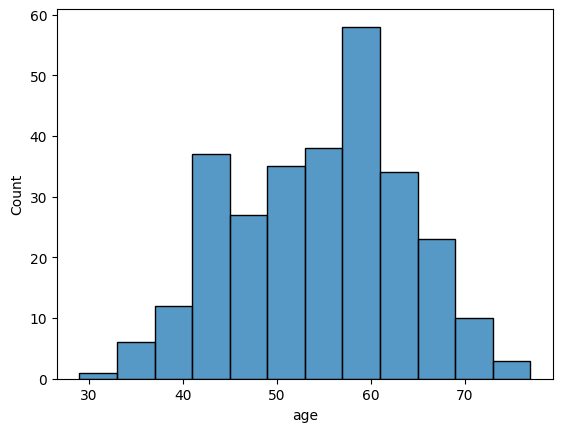

In [290]:
sns.histplot(data=data, x="age")

Age among participants seems normally distributed, youngest 29 yrs, oldest 77 yrs

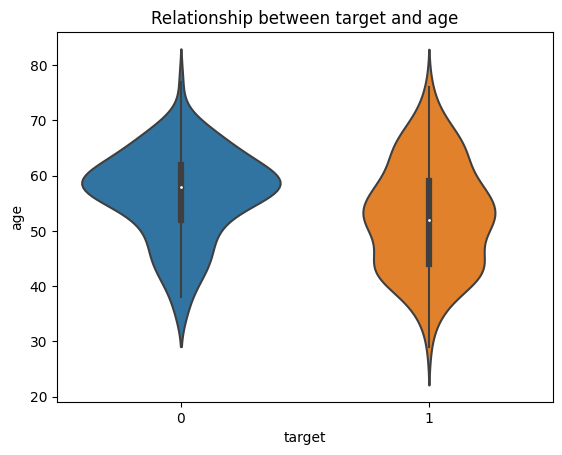

In [357]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.violinplot(x='target', y='age', data=data)
plt.xlabel('target')
plt.ylabel('age')
plt.title('Relationship between target and age')
plt.show()

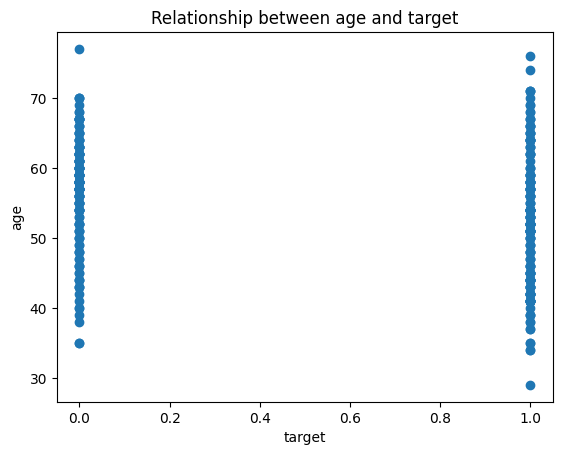

In [352]:
import matplotlib.pyplot as plt

plt.scatter(data['target'], data['age'])
plt.xlabel('target')
plt.ylabel('age')
plt.title('Relationship between age and target')
plt.show()

1 or 2 participants who are relative younger belore 35 yrs have heart disease.

In [292]:
data.groupby(['sex', 'target']).size()

sex  target
0    0          17
     1          68
1    0         108
     1          91
dtype: int64

In [293]:
# calculate counts of each category
counts = data.groupby(['sex', 'target']).size().reset_index(name='count')
counts

,sex,target,count
0,0,0,17
1,0,1,68
2,1,0,108
3,1,1,91


In [294]:
# convert count to percentage in the sex-target data
counts = counts.assign(percentage=counts['count'] / counts['count'].sum() * 100)
counts

,sex,target,count,percentage
0,0,0,17,5.985915
1,0,1,68,23.943662
2,1,0,108,38.028169
3,1,1,91,32.042254


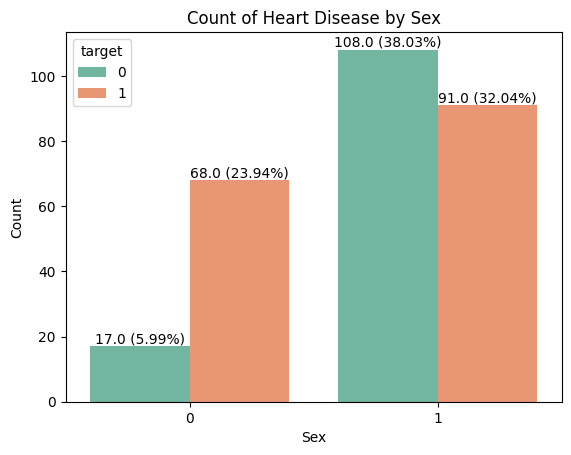

In [295]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create countplot
ax = sns.countplot(x='sex', hue='target', data=data, palette='Set2')

# Add labels and title
plt.xlabel('Sex')
plt.ylabel('Count')
plt.title('Count of Heart Disease by Sex')

# Calculate total count for each category
total_counts = data.groupby(['sex', 'target']).size()

# Add value and percentage labels on each bar
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height} ({height/total_counts.sum()*100:.2f}%)', (p.get_x() + p.get_width() / 2, height),
                ha='center', va='bottom')

# Show the plot
plt.show()

the distribution of sex vs. target(heart disesse) in this study implies that males are healthier than diseased in its sex group, while females are more diseased than healthy within its group. Overall, this study recruits a lot more males than females, which males take up to 70% of the total participants. In the male group, number of diseased and healthy males are close. However, in the femal group, the female participants are more diseased about 80% than the healthy.

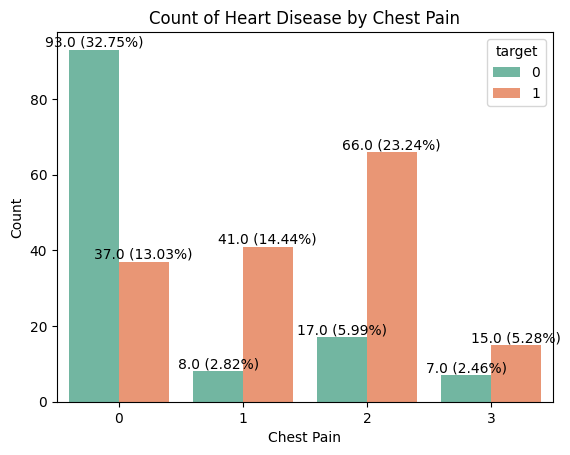

In [296]:
# Chest pain distribution according to target variable
import seaborn as sns
import matplotlib.pyplot as plt

# Create countplot
ax = sns.countplot(x='cp', hue='target', data=data, palette='Set2')

# Add labels and title
plt.xlabel('Chest Pain')
plt.ylabel('Count')
plt.title('Count of Heart Disease by Chest Pain')

# Calculate total count for each category
total_counts = data.groupby(['cp', 'target']).size()

# Add value and percentage labels on each bar
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height} ({height/total_counts.sum()*100:.2f}%)', (p.get_x() + p.get_width() / 2, height),
                ha='center', va='bottom')

# Show the plot
plt.show()

In the above graph, it seems that the healthy people who does not have heart disease have typical angina. Angina can be caused by other reason such as stress and exercise. Rather, the less-angina related groups, including asymptomatic, non-angina pain and atypical angina, report having heart disease more than no disease.

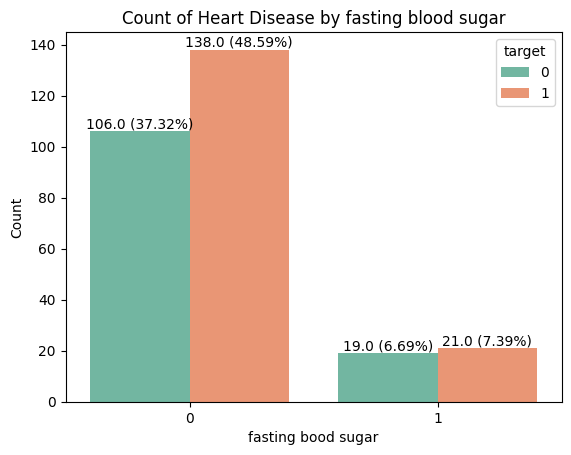

In [297]:
# Fasting blood sugar distribution according to target variable
# fps (Fasting Blood Sugar > 120 mg/dl): [0 = no, 1 = yes]
import seaborn as sns
import matplotlib.pyplot as plt

# Create countplot
ax = sns.countplot(x='fbs', hue='target', data=data, palette='Set2')

# Add labels and title
plt.xlabel('fasting bood sugar')
plt.ylabel('Count')
plt.title('Count of Heart Disease by fasting blood sugar')

# Calculate total count for each category
total_counts = data.groupby(['fbs', 'target']).size()

# Add value and percentage labels on each bar
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height} ({height/total_counts.sum()*100:.2f}%)', (p.get_x() + p.get_width() / 2, height),
                ha='center', va='bottom')

# Show the plot
plt.show()

The majotiry of participatns in the study have normal fasting blood sugar(fbs<=120 mg/dl)
However, participants who have normal fasting blood sugar are less healthy, as there are more diseased persons than healthy in the "normal fasting blood sugar" group. But for the participats who have higher fasting blood sugar, there is little difference between the diseased and no heart diseased subgroups. Hereby, a good or elevated fasting blood sugar is not a clear factor/index to predict the heart disease as fbs and heart disease do not have a direct relationship.

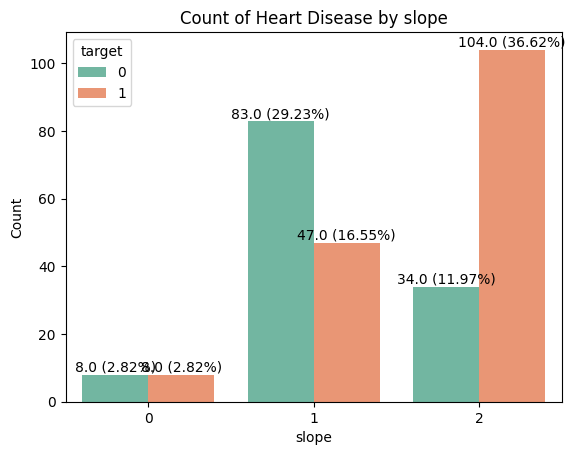

In [298]:
# Slope distribution according to target variable
# slope (the slope of the peak exercise ST segment): [0: downsloping; 1: flat; 2: upsloping]
import seaborn as sns
import matplotlib.pyplot as plt

# Create countplot
ax = sns.countplot(x='slope', hue='target', data=data, palette='Set2')

# Add labels and title
plt.xlabel('slope')
plt.ylabel('Count')
plt.title('Count of Heart Disease by slope')

# Calculate total count for each category
total_counts = data.groupby(['slope', 'target']).size()

# Add value and percentage labels on each bar
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height} ({height/total_counts.sum()*100:.2f}%)', (p.get_x() + p.get_width() / 2, height),
                ha='center', va='bottom')

# Show the plot
plt.show()


The heart disease seems related to the downssloping during exercise positively. flat slope has more healthier people that the diseased. No difference in the upsloping group. In general, a slight upslope or horizontal (flat) ST segment during exercise is considered a normal response,commonly observed in healthy individuals with no underlying cardiac conditions:

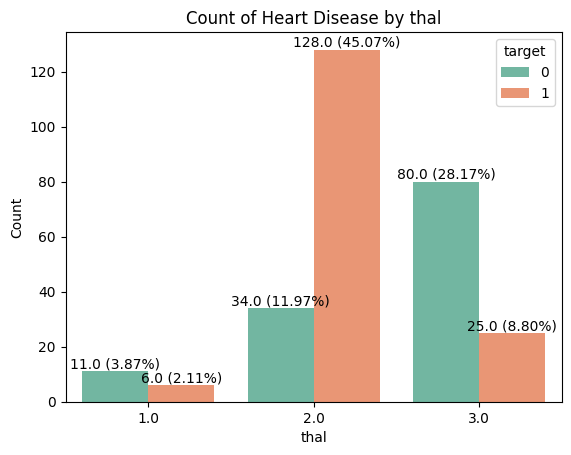

In [299]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create countplot
ax = sns.countplot(x='thal', hue='target', data=data, palette='Set2')

# Add labels and title
plt.xlabel('thal')
plt.ylabel('Count')
plt.title('Count of Heart Disease by thal')

# Calculate total count for each category
total_counts = data.groupby(['thal', 'target']).size()

# Add value and percentage labels on each bar
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height} ({height/total_counts.sum()*100:.2f}%)', (p.get_x() + p.get_width() / 2, height),
                ha='center', va='bottom')

# Show the plot
plt.show()

# thal: A blood disorder called thalassemia, categorical variable
# Value 1: fixed defect (no blood flow in some part of the heart)
# Value 2: normal blood flow
# Value 3: reversible defect (a blood flow is observed but it is not normal)
Participants of the normal blood flow in the thalassemia disorder seems to have a negative relationship with the heart disease, as the normal-blood-flow in the heart would lead to have more people who have heart disease in this study.

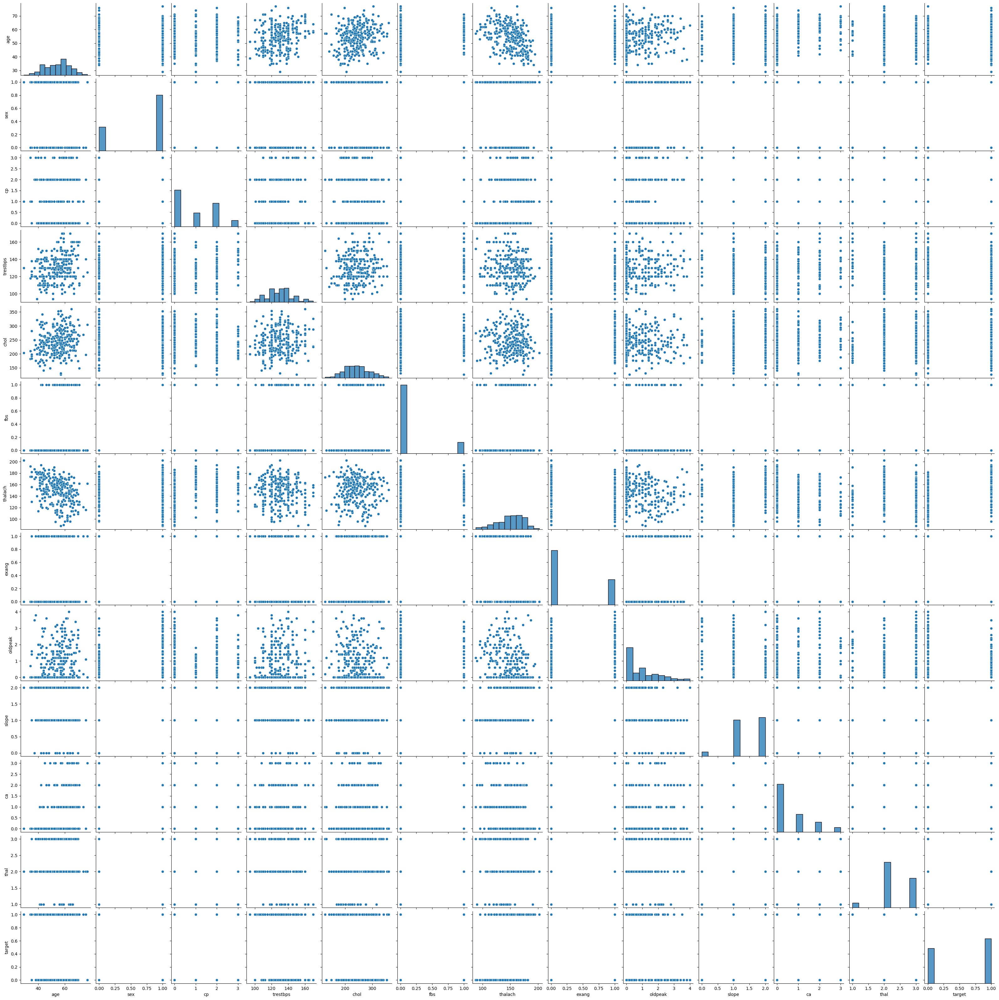

In [300]:
import seaborn
import matplotlib.pyplot as plt
data
sns.pairplot(data)

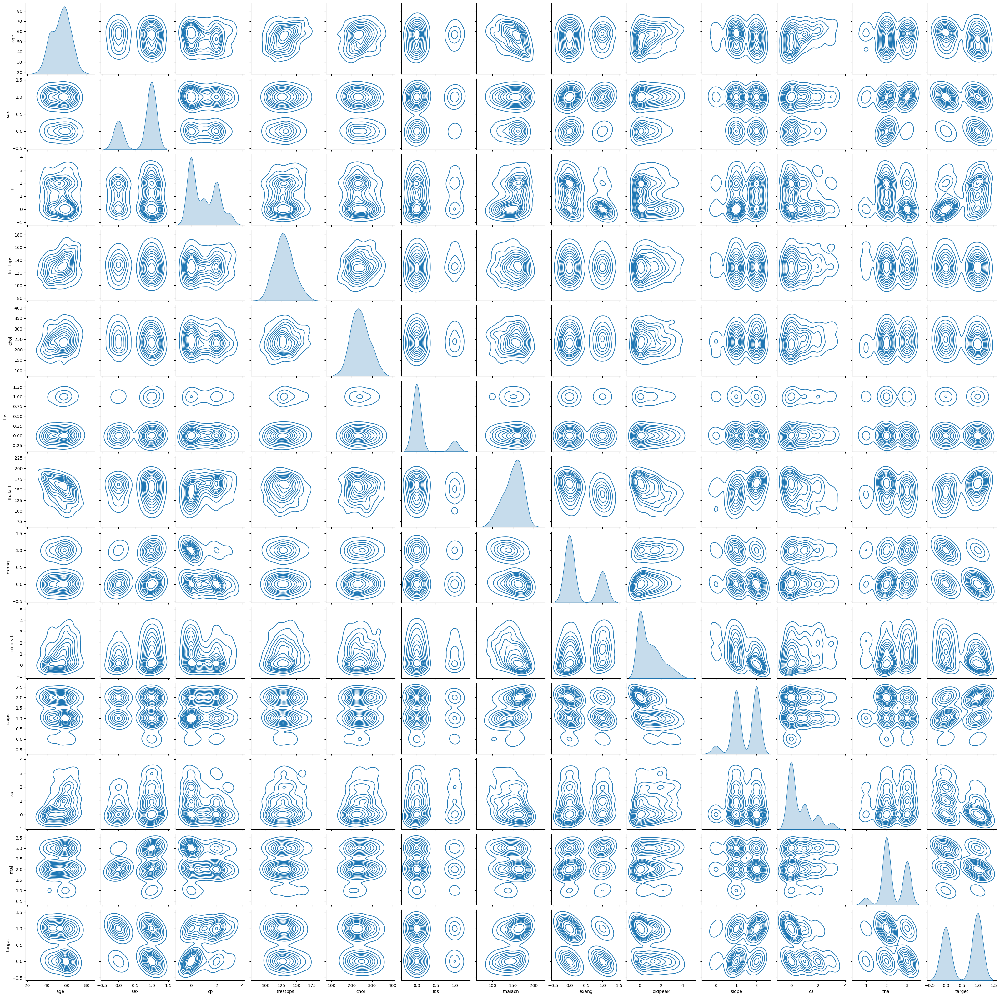

In [301]:
import seaborn as sns

# Assuming you have a DataFrame called 'data' containing your variables

# Create a pairplot with distribution plots
sns.pairplot(data, kind='kde')

# Display the plot
plt.show()

Oldpeak seems to have a clear and linear separation relationship between disease and non-disease
thalach has some but mild linear separation relationship between disease and non-disease.
Others do not have any clear separation

In [302]:
data.dtypes

age           int64
sex           int64
cp            int64
trestbps      int64
chol          int64
fbs           int64
restecg      object
thalach       int64
exang         int64
oldpeak     float64
slope         int64
ca          float64
thal        float64
target        int64
dtype: object

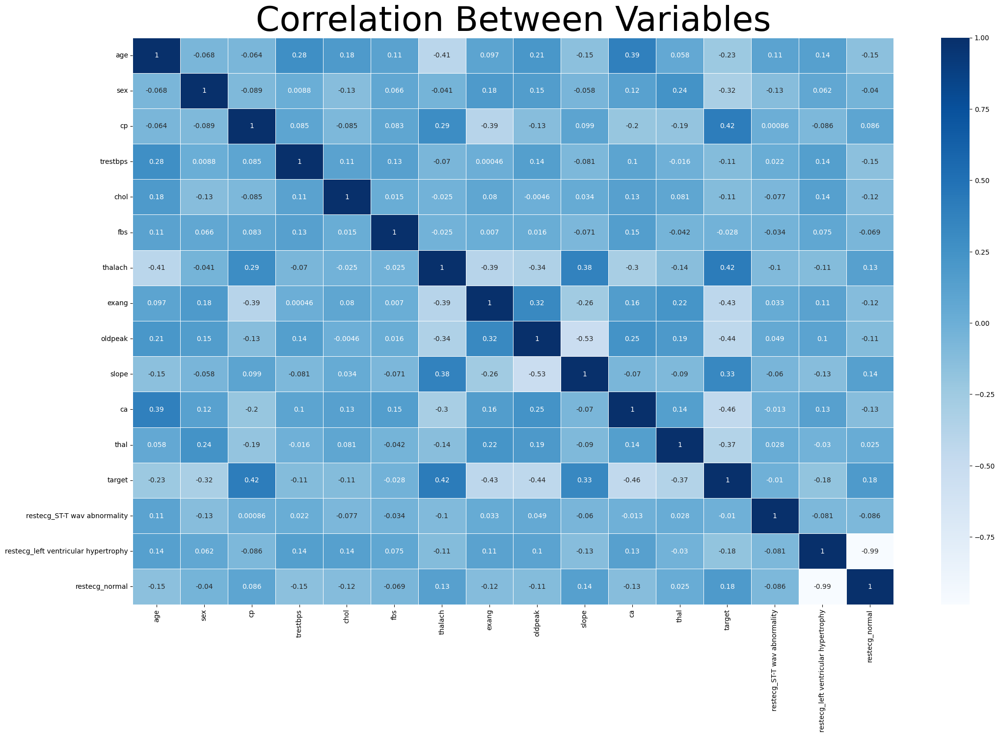

In [303]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have a DataFrame called 'df' containing your data

# Select only the numerical variables from the DataFrame
numerical_data = data.select_dtypes(include=['float64', 'int64'])

# Perform one-hot encoding on the categorical variables
categorical_data = pd.get_dummies(data.select_dtypes(include=['object']))

# Concatenate the numerical and encoded categorical variables
encoded_df = pd.concat([numerical_data, categorical_data], axis=1)

# Create the correlation matrix
correlation_matrix = encoded_df.corr()

# Set up the figure and plot the heatmap
plt.figure(figsize=(25, 15))
sns.heatmap(correlation_matrix, annot=True, linewidths=0.5, cmap="Blues")

plt.title('Correlation Between Variables', fontsize=50)
plt.show()


‘thalach’, ‘slope’ shows good positive correlation with target

‘oldpeak’, ‘exang’, ‘ca’,'cp', ‘thal’, ‘sex’, ‘age’ shows a good negative correlation with target

‘fbs’ ‘chol’, ‘trestbps’, ‘restecg’ has low correlation with our target

In [342]:
data.dtypes

age           int64
sex           int64
cp            int64
trestbps      int64
chol          int64
fbs           int64
restecg       int64
thalach       int64
exang         int64
oldpeak     float64
slope         int64
ca            int64
thal          int64
target        int64
dtype: object

In [349]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Define the feature data (X) by selecting the columns from the DataFrame
X = data[['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach', 'exang', 'oldpeak', 'slope', 'ca', 'thal']]

# Define the target variable (y) by selecting the column from the DataFrame
y = data['target']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Scale the feature data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create a logistic regression object with increased max_iter
logreg = LogisticRegression(max_iter=1000)  # Increase max_iter as needed

# Fit the model on the scaled training data
logreg.fit(X_train_scaled, y_train)

# Make predictions on the scaled test data
y_pred = logreg.predict(X_test_scaled)

# Generate the confusion matrix
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)


Confusion Matrix:
[[21  6]
 [ 3 31]]


The top-left value (21) represents the number of true negatives (TN), indicating the count of correctly predicted instances of the negative class.

The top-right value (6) represents the number of false positives (FP), indicating the count of incorrectly predicted instances of the negative class.

The bottom-left value (3) represents the number of false negatives (FN), indicating the count of incorrectly predicted instances of the positive class

The bottom-right value (31) represents the number of true positives (TP), indicating the count of correctly predicted instances of the positive class.


In [ ]:
# evaluate matrix
Accuracy: Accuracy = (TP + TN) / (TP + TN + FP + FN) = (31 + 21) / (31 + 21 + 6 + 3) = 0.88 (or 88%)

Precision: Precision = TP / (TP + FP) = 31 / (31 + 6) = 0.84 (or 84%)

Recall (Sensitivity): Recall = TP / (TP + FN) = 31 / (31 + 3) = 0.91 (or 91%)

Specificity: Specificity = TN / (TN + FP) = 21 / (21 + 6) = 0.78 (or 78%)

F1 Score: F1 Score = 2 * (Precision * Recall) / (Precision + Recall) = 2 * (0.84 * 0.91) / (0.84 + 0.91) = 0.87 (or 87%)

False Positive Rate: False Positive Rate = FP / (FP + TN) = 6 / (6 + 21) = 0.22 (or 22%)

False Negative Rate: False Negative Rate = FN / (FN + TP) = 3 / (3 + 31) = 0.09 (or 9%)


Overall, based on the provided metrics, the model seems to perform well with relatively high accuracy, precision, recall, and F1 score